<a href="https://colab.research.google.com/github/AvantiShri/colab_notebooks/blob/master/AutoencoderOnSticklebackData.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install stickleback

     |████████████████████████████████| 15.5 MB 62 kB/s 
     |████████████████████████████████| 5.9 MB 13.3 MB/s 
     |████████████████████████████████| 23.1 MB 63.8 MB/s 
     |████████████████████████████████| 3.3 MB 67.9 MB/s 
     |████████████████████████████████| 9.8 MB 51.7 MB/s 
     |████████████████████████████████| 26.3 MB 57.4 MB/s 
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.34.0
    Uninstalling llvmlite-0.34.0:
      Successfully uninstalled llvmlite-0.34.0
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1
  Attempting uninstall: numba
    Found existing installation: numba 0.51.2
    Uninstalling numba-0.51.2:
      Suc

In [2]:
import stickleback.data

sensors, events = stickleback.data.load_lunges()

In [20]:
import stickleback.visualize

stickleback.visualize.plot_sensors_events('bw180905-53', sensors, events)

In [3]:
import numpy as np

#from https://rigtorp.se/2011/01/01/rolling-statistics-numpy.html
def rolling_window(a, window):
    shape = a.shape[:-1] + (a.shape[-1] - window + 1, window)
    strides = a.strides + (a.strides[-1],)
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

#downsample by taking the median in windows of len "window", with stride
# of 'stride' between each window
def downsample(arr, window, stride):
  windowed_arr = rolling_window(a=arr, window=window)
  subsampled_windowed_arr = windowed_arr[::stride]
  return np.median(subsampled_windowed_arr, axis=-1)#,
          #np.max(subsampled_windowed_arr, axis=-1),
          #np.min(subsampled_windowed_arr, axis=-1))

#normalize by getting each sensor track to have similar scale
def normalize(arr):
  return arr/np.mean(np.abs(arr))

#Load the data for one of the whales
bw53_depth = np.array(sensors['bw180905-53']['depth'])
bw53_pitch = np.array(sensors['bw180905-53']['pitch'])
bw53_roll = np.array(sensors['bw180905-53']['roll'])
bw53_speed = np.array(sensors['bw180905-53']['speed'])

#Normalize the scales of the readings so the autoencoder will give
# roughly equal attention to all the sensor tracks
bw53_norm_depth = normalize(bw53_depth)
bw53_norm_pitch = normalize(bw53_pitch)
bw53_norm_roll = normalize(bw53_roll)
bw53_norm_speed = normalize(bw53_speed)

#Downsample the sensor tracks by taking the median every 20 intervals
bw53_downsamp_depth = downsample(bw53_norm_depth, window=20, stride=20)
bw53_downsamp_pitch = downsample(bw53_norm_pitch, window=20, stride=20)
bw53_downsamp_roll = downsample(bw53_norm_roll, window=20, stride=20)
bw53_downsamp_speed = downsample(bw53_norm_speed, window=20, stride=20)

In [14]:
#define the autoencoder

import keras
from keras.models import Model
import tensorflow as tf
tf.compat.v1.disable_eager_execution()

tf.compat.v1.set_random_seed(1234)
np.random.seed(1234)

N_FILTERS = 10

#'None' means the length of the input track can vary
input = keras.layers.Input(shape=(None,4)) #size of downsampled input

#perform encoding
conv1_preact = keras.layers.Conv1D(filters=10, kernel_size=5, strides=1,
                            dilation_rate=2, padding='same',
                            kernel_initializer='he_uniform')(input)
conv1_postact = keras.layers.Activation("relu")(conv1_preact)

conv2_preact = keras.layers.Conv1D(filters=10, kernel_size=5, strides=1,
                            dilation_rate=4, padding='same',
                            kernel_initializer='he_uniform')(conv1_postact)
conv2_postact = keras.layers.Activation("relu")(conv2_preact)

#Activity regularization is used to encourage a sparse encoding
conv3_preact = keras.layers.Conv1D(filters=10, kernel_size=5, strides=1,
              dilation_rate=8, padding='same',
              kernel_initializer='he_uniform',
              activity_regularizer=keras.regularizers.L1(l1=0.0001))(conv2_postact)
conv3_postact = keras.layers.Activation("relu")(conv3_preact)

#perform decoding
output = keras.layers.Conv1D(filters=4, kernel_size=20, strides=1, padding='same')(conv3_postact)

model = keras.models.Model(inputs=input, outputs=output)
model.compile(optimizer='adam', loss='mse')


In [15]:
#Concatenate the four sensor tracks together
bw53_downsamp_all = np.concatenate([bw53_downsamp_depth[:,None],
                                    bw53_downsamp_pitch[:,None],
                                    bw53_downsamp_roll[:,None],
                                    bw53_downsamp_speed[:,None]], axis=1)

#Fit the autoencoder. Autoencoder is expecting a 'batch' dimension, hence
# the dummy axis inclusion.
TRAIN_IDX = 2000 #we use the first TRAIN_IDX timesteps for training,
                 # the rest for validation
model.fit(x=bw53_downsamp_all[None,:TRAIN_IDX],
          y=bw53_downsamp_all[None,:TRAIN_IDX],
          validation_data=(bw53_downsamp_all[None,TRAIN_IDX:],
                           bw53_downsamp_all[None,TRAIN_IDX:]),
          callbacks=[keras.callbacks.EarlyStopping(
                       patience=500, restore_best_weights=True)],
          epochs=10000)

#Get the autoencoder's predictions
pred_bw53_downsamp_all = model.predict(bw53_downsamp_all[None,:])[0]

Train on 1 samples, validate on 1 samples
Epoch 1/10000
1/1 [==============================] - 0s 295ms/sample - loss: 9.8773 - val_loss: 5.0762
Epoch 2/10000
1/1 [==============================] - 0s 26ms/sample - loss: 8.6803 - val_loss: 4.5475
Epoch 3/10000
1/1 [==============================] - 0s 20ms/sample - loss: 7.7111 - val_loss: 4.1304
Epoch 4/10000
1/1 [==============================] - 0s 19ms/sample - loss: 6.9292 - val_loss: 3.8044
Epoch 5/10000
1/1 [==============================] - 0s 17ms/sample - loss: 6.3009 - val_loss: 3.5523
Epoch 6/10000
1/1 [==============================] - ETA: 0s - loss: 5.7994

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:2470: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 38ms/sample - loss: 0.1572 - val_loss: 0.4442
Epoch 1978/10000
1/1 [==============================] - 0s 22ms/sample - loss: 0.1572 - val_loss: 0.4463
Epoch 1979/10000
1/1 [==============================] - 0s 23ms/sample - loss: 0.1572 - val_loss: 0.4443
Epoch 1980/10000
1/1 [==============================] - 0s 39ms/sample - loss: 0.1571 - val_loss: 0.4459
Epoch 1981/10000
1/1 [==============================] - 0s 24ms/sample - loss: 0.1570 - val_loss: 0.4447
Epoch 1982/10000
1/1 [==============================] - 0s 26ms/sample - loss: 0.1569 - val_loss: 0.4453
Epoch 1983/10000
1/1 [==============================] - 0s 23ms/sample - loss: 0.1568 - val_loss: 0.4449
Epoch 1984/10000
1/1 [==============================] - 0s 25ms/sample - loss: 0.1567 - val_loss: 0.4443
Epoch 1985/10000
1/1 [==============================] - 0s 27ms/sample - loss: 0.1566 - val_loss: 0.4451
Epoch 1986/10000
1/1 

In [16]:

#Get the activations of the last layer of the encoder (before the output);
# this can be used to inspect whether the sparse encoding might
# have learned interesting patterns
bottleneck_activations = keras.backend.get_session().run(
    model.layers[-2].output,
    feed_dict={model.input: bw53_downsamp_all[None,:]})[0]



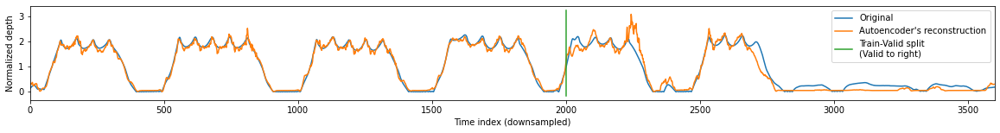

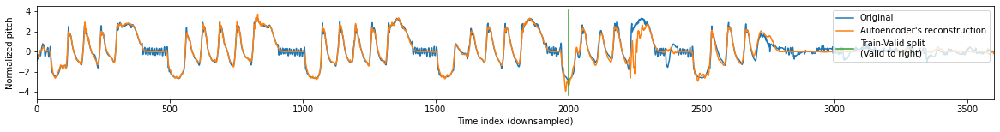

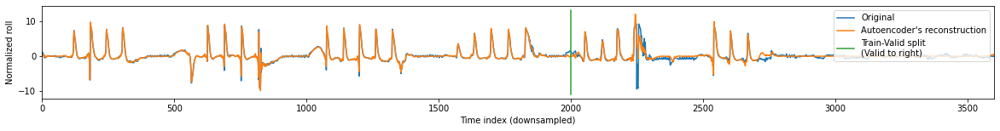

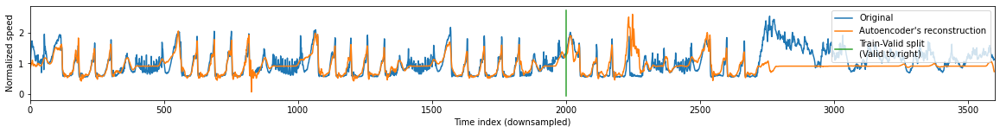

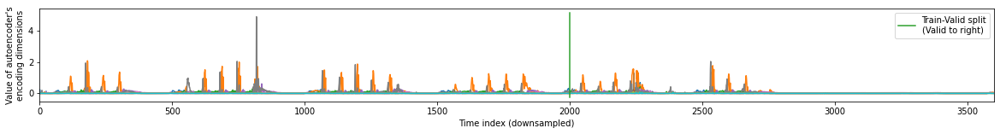

In [31]:
from matplotlib import pyplot as plt

#Plot the true sensor tracks (blue)
# overlaid with the autoencoder predictions (orange)
for i,trackname in zip(range(4), ['depth', 'pitch', 'roll', 'speed']):
  plt.figure(figsize=(20,2))
  handles = []
  handles.extend(plt.plot(bw53_downsamp_all[:,i]))
  handles.extend(plt.plot(pred_bw53_downsamp_all[:,i]))
  handles.extend(plt.plot([2000,2000], [plt.ylim()[0], plt.ylim()[1]]))
  plt.xlim(0, len(bw53_downsamp_all[:,i]));
  plt.ylabel("Normalized "+str(trackname))
  plt.xlabel("Time index (downsampled)")
  plt.legend(handles=handles,
             labels=["Original", "Autoencoder's reconstruction",
                     "Train-Valid split\n(Valid to right)"], loc=1)
  plt.show()

#plot the activations of the encoding layer to see if any features in
# the encoding seem to correspond to biological events of interest
plt.figure(figsize=(20,2))
for i in range(bottleneck_activations.shape[1]):
  plt.plot(bottleneck_activations[:,i])
plot, = plt.plot([2000,2000], [plt.ylim()[0], plt.ylim()[1]], color="C2")
plt.legend(handles=[plot],
             labels=["Train-Valid split\n(Valid to right)"], loc=1)
plt.xlim(0, len(bw53_downsamp_all[:,0]))
plt.ylabel("Value of autoencoder's\nencoding dimensions")
plt.xlabel("Time index (downsampled)")
plt.show()